# Preliminaries
## Software versions and configurations

`pip install dimcat Jinja2 colorlover GitPython plotly`

In [1]:
import os
from git import Repo
import dimcat as dc
from ms3 import __version__ as ms3_version

In [2]:
dataset_path = "~/all_subcorpora"

In [3]:
repo = Repo(dataset_path)
notebook_repo = Repo('.', search_parent_directories=True)
notebook_repo_path = notebook_repo.git.rev_parse("--show-toplevel")
print(f"Notebook repository '{os.path.basename(notebook_repo_path)}' @ {notebook_repo.commit().hexsha[:7]}")
print(f"Data repo '{os.path.basename(dataset_path)}' @ {repo.commit().hexsha[:7]}")
print(f"dimcat version {dc.__version__}")
print(f"ms3 version {ms3_version}")

Notebook repository 'dimcat' @ c076a4d
Data repo 'all_subcorpora' @ 9720734
dimcat version 0.2.0.post1.dev64+gda0a036
ms3 version 1.0.2


In [4]:
%load_ext autoreload
%autoreload 2
from collections import defaultdict, Counter
from fractions import Fraction
from IPython.display import HTML
import ms3
import plotly.express as px
import colorlover
import pandas as pd
import numpy as np
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 500)
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
plt.set_loglevel('error')

This javascript allows to add a "Toggle Code" button to every cell as per http://www.eointravers.com/post/jupyter-toggle/

In [5]:
HTML('''<script>
  function code_toggle() {
    if (code_shown){
      $('div.input').hide('500');
      $('#toggleButton').val('Show Code')
    } else {
      $('div.input').show('500');
      $('#toggleButton').val('Hide Code')
    }
    code_shown = !code_shown
  }
  $( document ).ready(function(){
    code_shown=false;
    $('div.input').hide()
  });
</script>
<form action="javascript:code_toggle()"><input type="submit" id="toggleButton" value="Show Code"></form>''')

In [6]:
STD_LAYOUT = {
 'paper_bgcolor': '#FFFFFF',
 'plot_bgcolor': '#FFFFFF',
 'margin': {'l': 40, 'r': 0, 'b': 0, 't': 40, 'pad': 0},
 'font': {'size': 15}
}
import colorlover
#for name, scales in colorlover.scales['6']['qual'].items():
#    print(name)
#    display(HTML(colorlover.to_html(scales)))
cadence_colors = dict(zip(('HC', 'PAC', 'PC', 'IAC', 'DC', 'EC'), colorlover.scales['6']['qual']['Set1']))

def value_count_df(S, thing=None, counts='counts'):
    thing = S.name if thing is None else thing
    df = S.value_counts().rename(counts).to_frame()
    df.index.rename(thing, inplace=True)
    return df

def color_background(x, color="#ffffb3"):
    return np.where(x.notna().to_numpy(), f"background-color: {color};", None)


## Data loading

In [7]:
dataset = dc.Dataset()
for folder in ['bach_solo', 'beethoven_piano_sonatas', 'c_schumann_lieder', 'chopin_mazurkas', 'corelli', 'debussy_suite_bergamasque', 'dvorak_silhouettes', 'grieg_lyrical_pieces', 'handel_keyboard', 'jc_bach_sonatas', 'liszt_pelerinage', 'mahler_kindertotenlieder', 'medtner_tales', 'pleyel_quartets', 'scarlatti_sonatas', 'schubert_dances', 'schumann_kinderszenen', 'tchaikovsky_seasons', 'wf_bach_sonatas']:
    print("Loading", folder)
    path = os.path.join(dataset_path, folder)
    dataset.load(directory=path)

Loading bach_solo
Loading beethoven_piano_sonatas
Loading c_schumann_lieder
Loading chopin_mazurkas
Loading corelli
Loading debussy_suite_bergamasque
Loading dvorak_silhouettes
Loading grieg_lyrical_pieces
Loading handel_keyboard
Loading jc_bach_sonatas
Loading liszt_pelerinage
Loading mahler_kindertotenlieder
Loading medtner_tales
Loading pleyel_quartets
Loading scarlatti_sonatas
Loading schubert_dances
Loading schumann_kinderszenen
Loading tchaikovsky_seasons
Loading wf_bach_sonatas


In [8]:
dataset.data

[default|all]
All corpora
-----------
View: This view is called 'default'. It 
	- excludes fnames that are not contained in the metadata,
	- filters out file extensions requiring conversion (such as .xml), and
	- excludes review files and folders.

                               has   active   scores measures           notes        expanded       
                          metadata     view detected detected parsed detected parsed detected parsed
corpus                                                                                              
bach_solo                      yes  default       68       68     68       68     68       68     68
beethoven_piano_sonatas        yes  default       87       87     87       87     87       64     64
c_schumann_lieder              yes  default       12       12     12       12     12       12     12
chopin_mazurkas                yes  default       55       55     55       55     55       55     55
corelli                        yes  default 

In [9]:
#dataset = Corpus(directory=dataset_path)
#dataset.data

### Filtering out pieces without cadence annotations

In [10]:
hascadence = dc.HasCadenceAnnotationsFilter().process_data(dataset)
display(HTML(f"<h4>Before: {len(dataset.indices[()])} pieces; "
             f"after removing those without cadence labels: {len(hascadence.indices[()])}</h4>"))

INCOMPLETE_MC_WRONGLY_COMPLETED_WARNING (3, 96) ms3.Parse.beethoven_piano_sonatas.04-3 -- /home/hentsche/miniconda3/envs/dimcat/lib/python3.10/site-packages/ms3/bs4_measures.py (line 753) make_offset_col():
	The incomplete MC 96 (timesig 3/4, act_dur 1/4) is completed by 1 incorrect duration (expected: 1/2):
	{97: Fraction(3, 4)}
INCOMPLETE_MC_WRONGLY_COMPLETED_WARNING (3, 112) ms3.Parse.beethoven_piano_sonatas.04-3 -- /home/hentsche/miniconda3/envs/dimcat/lib/python3.10/site-packages/ms3/bs4_measures.py (line 753) make_offset_col():
	The incomplete MC 112 (timesig 3/4, act_dur 1/2) is completed by 1 incorrect duration (expected: 1/4):
	{25: Fraction(3, 4), 113: Fraction(1, 4)}
INCOMPLETE_MC_WRONGLY_COMPLETED_WARNING (3, 39) ms3.Parse.beethoven_piano_sonatas.13-1 -- /home/hentsche/miniconda3/envs/dimcat/lib/python3.10/site-packages/ms3/bs4_measures.py (line 753) make_offset_col():
	The incomplete MC 39 (timesig 3/4, act_dur 1/8) is completed by 1 incorrect duration (expected: 5/8):
	{4

### Show corpora containing pieces with cadence annotations

In [11]:
grouped_by_dataset = dc.CorpusGrouper().process_data(hascadence)
corpora = {group[0]: f"{len(ixs)} pieces" for group, ixs in  grouped_by_dataset.indices.items()}
print(f"{len(corpora)} corpora with {sum(map(len, grouped_by_dataset.indices.values()))} pieces containing cadence annotations:")
corpora

19 corpora with 587 pieces containing cadence annotations:


{'bach_solo': '32 pieces',
 'beethoven_piano_sonatas': '64 pieces',
 'c_schumann_lieder': '12 pieces',
 'chopin_mazurkas': '50 pieces',
 'corelli': '148 pieces',
 'debussy_suite_bergamasque': '4 pieces',
 'dvorak_silhouettes': '12 pieces',
 'grieg_lyrical_pieces': '65 pieces',
 'handel_keyboard': '6 pieces',
 'jc_bach_sonatas': '29 pieces',
 'liszt_pelerinage': '19 pieces',
 'mahler_kindertotenlieder': '5 pieces',
 'medtner_tales': '16 pieces',
 'pleyel_quartets': '6 pieces',
 'scarlatti_sonatas': '69 pieces',
 'schubert_dances': '16 pieces',
 'schumann_kinderszenen': '13 pieces',
 'tchaikovsky_seasons': '12 pieces',
 'wf_bach_sonatas': '9 pieces'}

### All annotation labels from the selected pieces

In [12]:
all_labels = hascadence.get_facet('expanded')

print(f"{len(all_labels.index)} hand-annotated harmony labels:")
all_labels.iloc[:10, 14:].style.apply(color_background, subset="chord")

95751 hand-annotated harmony labels:


In [13]:
HTML('''<script>
  function code_toggle() {
    if (code_shown){
      $('div.input').hide('500');
      $('#toggleButton').val('Show Code')
    } else {
      $('div.input').show('500');
      $('#toggleButton').val('Hide Code')
    }
    code_shown = !code_shown
  }
  $( document ).ready(function(){
    code_shown=false;
    $('div.input').hide()
  });
</script>
<form action="javascript:code_toggle()"><input type="submit" id="toggleButton" value="Show Code"></form>''')

### Metadata

In [14]:
dataset_metadata = hascadence.data.metadata()
hascadence_metadata = dataset_metadata.loc[hascadence.indices[()]]
hascadence_metadata.index.rename('dataset', level=0, inplace=True)
hascadence_metadata.head()

TimeSig KeySig  last_mc  last_mn  length_qb  \
dataset   fname                                                              
bach_solo BWV1009_01_Prelude    1: 3/4   1: 0       88       88      264.0   
          BWV1009_02_Allemande  1: 4/4   1: 0       25       24       96.0   
          BWV1009_03_Courante   1: 6/8   1: 0       86       84      252.0   
          BWV1009_04_Sarabande  1: 3/4   1: 0       24       24       72.0   
          BWV1009_05_BourréeI   1: 2/2   1: 0       29       28      112.0   

                                last_mc_unfolded  last_mn_unfolded  \
dataset   fname                                                      
bach_solo BWV1009_01_Prelude                88.0              88.0   
          BWV1009_02_Allemande              50.0              48.0   
          BWV1009_03_Courante              172.0             168.0   
          BWV1009_04_Sarabande              48.0              48.0   
          BWV1009_05_BourréeI               58.0              56.0   

                                length_qb_unfolded volta_mcs  all_notes_qb  \
dataset   fname                                                              
bach_solo BWV1009_01_Prelude                 264.0       NaN        292.00   
          BWV1009_02_Allemande               192.0       NaN        107.25   
          BWV1009_03_Courante                504.0       NaN        257.00   
          BWV1009_04_Sarabande               144.0       NaN        122.00   
          BWV1009_05_BourréeI                224.0       NaN        118.50   

                                n_onsets  n_onset_positions  \
dataset   fname                                               
bach_solo BWV1009_01_Prelude        1007                970   
          BWV1009_02_Allemande       486                469   
          BWV1009_03_Courante        495                492   
          BWV1009_04_Sarabande       217                171   
          BWV1009_05_BourréeI        191                186   

                                guitar_chord_count  form_label_count  \
dataset   fname                                                        
bach_solo BWV1009_01_Prelude                     0                 0   
          BWV1009_02_Allemande                   0                 0   
          BWV1009_03_Courante                    0                 0   
          BWV1009_04_Sarabande                   0                 0   
          BWV1009_05_BourréeI                    0                 0   

                                label_count harmony_version annotated_key  \
dataset   fname                                                             
bach_solo BWV1009_01_Prelude            113           2.3.0             C   
          BWV1009_02_Allemande          106           2.3.0             C   
          BWV1009_03_Courante            83           2.3.0             C   
          BWV1009_04_Sarabande           55           2.3.0             C   
          BWV1009_05_BourréeI            64           2.3.0             C   

                                  annotators  composed_start  composed_end  \
dataset   fname                                                              
bach_solo BWV1009_01_Prelude    Adrian Nagel            1717          1723   
          BWV1009_02_Allemande  Adrian Nagel            1717          1723   
          BWV1009_03_Courante   Adrian Nagel            1717          1723   
          BWV1009_04_Sarabande  Adrian Nagel            1717          1723   
          BWV1009_05_BourréeI   Adrian Nagel            1717          1723   

                                  composer                    workTitle  \
dataset   fname                                                           
bach_solo BWV1009_01_Prelude    Bach, J.S.  Cello Suite No.3 in C major   
          BWV1009_02_Allemande  Bach, J.S.  Cello Suite No.3 in C major   
          BWV1009_03_Courante   Bach, J.S.  Cello Suite No.3 in C major   
          BWV1009_04_Sarabande  Bach,

In [15]:
hascadence_metadata.groupby(level=0).composed_end.value_counts()

dataset                    composed_end
bach_solo                  1723            32
beethoven_piano_sonatas    1795            12
                           1798            10
                           1802            10
                           1797             8
                           1822             5
                           1799             3
                           1804             3
                           1805             3
                           1810             3
                           1820             3
                           1796             2
                           1809             2
c_schumann_lieder          1844             6
                           1853             6
chopin_mazurkas            1832             9
                           1833             8
                           1838             5
                           1846             4
                           1837             3
                           1842         

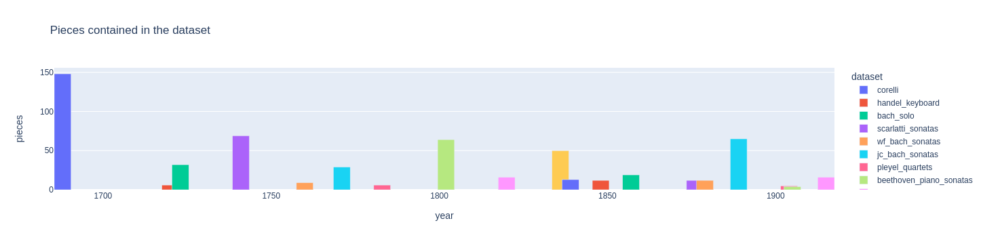

In [16]:
mean_composition_years = hascadence_metadata.groupby(level=0).composed_end.mean().astype(int).sort_values()
chronological_order = mean_composition_years.index.to_list()
bar_data = pd.concat([mean_composition_years.rename('year'), 
                      hascadence_metadata.groupby(level='dataset').size().rename('pieces')],
                     axis=1
                    ).reset_index()
fig = px.bar(bar_data, x='year', y='pieces', color='dataset', title='Pieces contained in the dataset')
fig.update_traces(width=5)

# Keys

## Computing extent of key segments from annotations

**In the following, major and minor keys are distinguished as boolean `localkey_is_minor=(False|True)`**

In [17]:
segmented_by_keys = dc.Pipeline([
                         dc.LocalKeySlicer(), 
                         dc.ModeGrouper()])\
                        .process_data(hascadence)
key_segments = segmented_by_keys.get_slice_info()

In [18]:
print(key_segments.duration_qb.dtype)
key_segments.duration_qb = pd.to_numeric(key_segments.duration_qb)

object


In [19]:
key_segments.iloc[:15, 11:].fillna('').style.apply(color_background, subset="localkey")

## Ratio between major and minor key segments by aggregated durations
### Overall

In [20]:
maj_min_ratio = key_segments.groupby(level="localkey_is_minor").duration_qb.sum().to_frame()
maj_min_ratio['fraction'] = (100.0 * maj_min_ratio.duration_qb / maj_min_ratio.duration_qb.sum()).round(1)
maj_min_ratio

,duration_qb,fraction
localkey_is_minor,,
False,87978.0,61.3
True,55521.0,38.7


### By dataset

In [21]:
segment_duration_per_dataset = key_segments.groupby(level=["corpus", "localkey_is_minor"]).duration_qb.sum().round(2)
norm_segment_duration_per_dataset = 100 * segment_duration_per_dataset / segment_duration_per_dataset.groupby(level="corpus").sum()
maj_min_ratio_per_dataset = pd.concat([segment_duration_per_dataset, 
                                      norm_segment_duration_per_dataset.rename('fraction').round(1).astype(str)+" %"], 
                                     axis=1)

In [22]:
segment_duration_per_dataset = key_segments.groupby(level=["corpus", "localkey_is_minor"]).duration_qb.sum().reset_index()

In [23]:
maj_min_ratio_per_dataset.reset_index()

,corpus,localkey_is_minor,duration_qb,fraction
0,bach_solo,False,3340.00,59.5 %
1,bach_solo,True,2277.25,40.5 %
2,beethoven_piano_sonatas,False,23659.75,66.3 %
3,beethoven_piano_sonatas,True,12003.38,33.7 %
4,c_schumann_lieder,False,1296.00,88.9 %
5,c_schumann_lieder,True,162.50,11.1 %
6,chopin_mazurkas,False,7845.50,57.2 %
7,chopin_mazurkas,True,5881.75,42.8 %
8,corelli,False,9607.00,53.4 %
9,corelli,True,8387.00,46.6 %


In [24]:
chronological_order

['corelli',
 'handel_keyboard',
 'bach_solo',
 'scarlatti_sonatas',
 'wf_bach_sonatas',
 'jc_bach_sonatas',
 'pleyel_quartets',
 'beethoven_piano_sonatas',
 'schubert_dances',
 'chopin_mazurkas',
 'schumann_kinderszenen',
 'c_schumann_lieder',
 'liszt_pelerinage',
 'tchaikovsky_seasons',
 'dvorak_silhouettes',
 'grieg_lyrical_pieces',
 'mahler_kindertotenlieder',
 'debussy_suite_bergamasque',
 'medtner_tales']

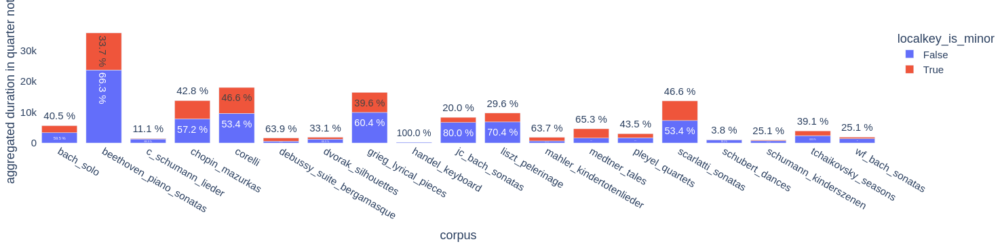

In [25]:
fig = px.bar(maj_min_ratio_per_dataset.reset_index(), 
       x="corpus", 
       y="duration_qb", 
       color="localkey_is_minor", 
       text='fraction',
       labels=dict(dataset='', duration_qb="aggregated duration in quarter notes"),
       category_orders=dict(dataset=chronological_order)
    )
fig.update_layout(**STD_LAYOUT)

## Annotation table sliced by key segments

In [26]:
annotations_by_keys = segmented_by_keys.get_facet("expanded")
annotations_by_keys

mc  \
localkey_is_minor corpus          fname              localkey_slice interval             
False             bach_solo       BWV1009_01_Prelude [0.0, 264.0)   [0.0, 6.0)       1   
                                                                    [6.0, 8.0)       3   
                                                                    [8.0, 9.0)       3   
                                                                    [9.0, 12.0)      4   
                                                                    [12.0, 14.0)     5   
...                                                                                 ..   
True              wf_bach_sonatas F003_n04c          [266.0, 335.0) [327.0, 327.0)  84   
                                                                    [330.0, 331.0)  85   
                                                                    [331.0, 332.0)  85   
                                                                    [332.0, 333.0)  85   
                                                                    [333.0, 335.0)  86   

                                                                                    mn  \
localkey_is_minor corpus          fname              localkey_slice interval             
False             bach_solo       BWV1009_01_Prelude [0.0, 264.0)   [0.0, 6.0)       1   
                                                                    [6.0, 8.0)       3   
                                                                    [8.0, 9.0)       3   
                                                                    [9.0, 12.0)      4   
                                                                    [12.0, 14.0)     5   
...                                                                                 ..   
True              wf_bach_sonatas F003_n04c          [266.0, 335.0) [327.0, 327.0)  82   
                                                                    [330.0, 331.0)  83   
                                                                    [331.0, 332.0)  83   
                                                                    [332.0, 333.0)  83   
                                                                    [333.0, 335.0)  84   

                                                                                   quarterbeats  \
localkey_is_minor corpus          fname              localkey_slice interval                      
False             bach_solo       BWV1009_01_Prelude [0.0, 264.0)   [0.0, 6.0)                0   
                                                                    [6.0, 8.0)                6   
                                                                    [8.0, 9.0)                8   
                                                                    [9.0, 12.0)               9   
                                                                    [12.0, 14.0)             12   
...                                                                                         ...   
True              wf_bach_sonatas F003_n04c          [266.0, 335.0) [327.0, 327.0)          327   
                                                                    [330.0, 331.0)          330   
                                                                    [331.0, 332.0)          331   
                                                                    [332.0, 333.0)          332   
                                                                    [333.0, 335.0)          333   

                                                                                    duration_qb  \
localkey_is_minor corpus          fname              localkey_slice interval                      
False             bach_solo       BWV1009_01_Prelude [0.0, 264.0)   [0.0, 6.0)              6.0   
                                                                    [6.0, 8.0)              2.0   
                                                          

In [27]:
HTML('''<script>
  function code_toggle() {
    if (code_shown){
      $('div.input').hide('500');
      $('#toggleButton').val('Show Code')
    } else {
      $('div.input').show('500');
      $('#toggleButton').val('Hide Code')
    }
    code_shown = !code_shown
  }
  $( document ).ready(function(){
    code_shown=false;
    $('div.input').hide()
  });
</script>
<form action="javascript:code_toggle()"><input type="submit" id="toggleButton" value="Show Code"></form>''')

# Phrases
## Overview
### Presence of phrase annotation symbols per dataset:

In [28]:
all_labels.groupby(["corpus"]).phraseend.value_counts()

corpus                     phraseend
bach_solo                  }            172
                           {            170
                           }{            24
beethoven_piano_sonatas    }            925
                           {            918
                           }{           424
c_schumann_lieder          {             55
                           }             55
                           }{            34
chopin_mazurkas            }            505
                           {            498
                           }{            49
corelli                    }            705
                           {            702
                           }{           379
debussy_suite_bergamasque  {             15
                           }             15
                           }{            10
dvorak_silhouettes         {             93
                           }             92
                           }{            77
grieg_lyrical_pieces       }           

### Presence of legacy phrase endings

In [29]:
all_labels[all_labels.phraseend == r'\\'].style.apply(color_background, subset="label")

### A table with the extents of all annotated phrases
**Relevant columns:**
* `quarterbeats`: start position for each phrase
* `duration_qb`: duration of each phrase, measured in quarter notes 
* `phrase_slice`: time interval of each annotated phrases (for segmenting chord progressions and notes)

In [30]:
# segmented = PhraseSlicer().process_data(hascadence)
segmented = dc.PhraseSlicer().process_data(grouped_by_dataset)
phrases = segmented.get_slice_info()
print(f"Overall number of phrases is {len(phrases.index)}")
phrases.head(10).style.apply(color_background, subset=["quarterbeats", "duration_qb"])

Overall number of phrases is 6688


In [31]:
print(phrases.duration_qb.dtype)
phrases.duration_qb = pd.to_numeric(phrases.duration_qb)

object


### Annotation table sliced by phrase annotations

ToDo: Example for overlap / phrase beginning without new chord

In [32]:
phrase_segments = segmented.get_facet("expanded")
phrase_segments.head(10)

mc  mn  \
corpus    fname              phrase_slice   interval                 
bach_solo BWV1009_01_Prelude [0.0, 18.25)   [0.0, 0.0)       1   1   
                                            [0.0, 6.0)       1   1   
                                            [6.0, 8.0)       3   3   
                                            [8.0, 9.0)       3   3   
                                            [9.0, 12.0)      4   4   
                                            [12.0, 14.0)     5   5   
                                            [14.0, 15.0)     5   5   
                                            [15.0, 15.0)     6   6   
                                            [15.0, 18.25)    6   6   
                             [18.25, 36.25) [18.25, 18.25)   7   7   

                                                           quarterbeats  \
corpus    fname              phrase_slice   interval                      
bach_solo BWV1009_01_Prelude [0.0, 18.25)   [0.0, 0.0)              0.0   
                                            [0.0, 6.0)              0.0   
                                            [6.0, 8.0)              6.0   
                                            [8.0, 9.0)              8.0   
                                            [9.0, 12.0)             9.0   
                                            [12.0, 14.0)           12.0   
                                            [14.0, 15.0)           14.0   
                                            [15.0, 15.0)           15.0   
                                            [15.0, 18.25)          15.0   
                             [18.25, 36.25) [18.25, 18.25)        18.25   

                                                            duration_qb  \
corpus    fname              phrase_slice   interval                      
bach_solo BWV1009_01_Prelude [0.0, 18.25)   [0.0, 0.0)             0.00   
                                            [0.0, 6.0)             6.00   
                                            [6.0, 8.0)             2.00   
                                            [8.0, 9.0)             1.00   
                                            [9.0, 12.0)            3.00   
                                            [12.0, 14.0)           2.00   
                                            [14.0, 15.0)           1.00   
                                            [15.0, 15.0)           0.00   
                                            [15.0, 18.25)          3.25   
                             [18.25, 36.25) [18.25, 18.25)         0.00   

                                                           mc_onset mn_onset  \
corpus    fname              phrase_slice   interval                           
bach_solo BWV1009_01_Prelude [0.0, 18.25)   [0.0, 0.0)            0        0   
                                            [0.0, 6.0)            0        0   
                                            [6.0, 8.0)            0        0   
                                            [8.0, 9.0)          1/2      1/2   
                                            [9.0, 12.0)           0        0   
                                            [12.0, 14.0)          0        0   
                                            [14.0, 15.0)        1/2      1/2   
                                            [15.0, 15.0)          0        0   
                                            [15.0, 18.25)         0        0   
                             [18.25, 36.25) [18.25, 18.25)     1/16     1/16   

                                                           timesig  staff  \
corpus    fname              phrase_slice   interval                        
bach_solo BWV1009_01_Prelude [0.0, 18.25)   [0.0, 0.0)         3/4      1   
                                            [0.0, 6.0)         3/4      1   
                                            [6.0, 8.0)         3/4      1   
                                            [8.0, 9.0)         3/4     

In [33]:
print(phrase_segments.duration_qb.dtype)
phrase_segments.duration_qb = pd.to_numeric(phrase_segments.duration_qb)

float64


## Distribution of phrase lengths
### Histogram summarizing the lengths of all phrases measured in quarter notes

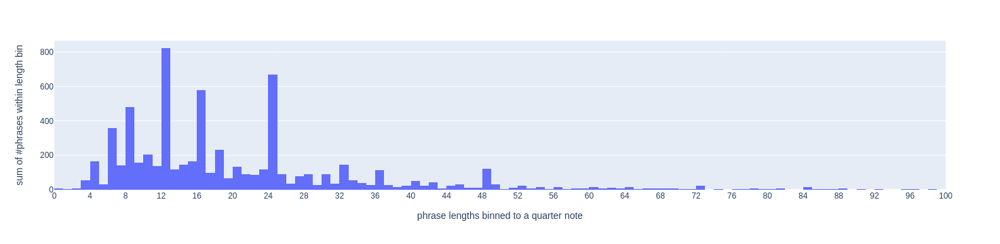

In [34]:
phrase_durations = phrases.duration_qb.value_counts() 
histogram = px.histogram(x=phrase_durations.index, y=phrase_durations, labels=dict(x='phrase lengths binned to a quarter note', y='#phrases within length bin'))
histogram.update_traces(xbins=dict( # bins used for histogram
        #start=0.0,
        end=100.0,
        size=1
    ))
histogram.update_xaxes(dtick=4)
histogram.show()

### Bar plot showing approximative phrase length in measures

**Simply by subtracting for the span of every phrase the first measure measure number from the last.**

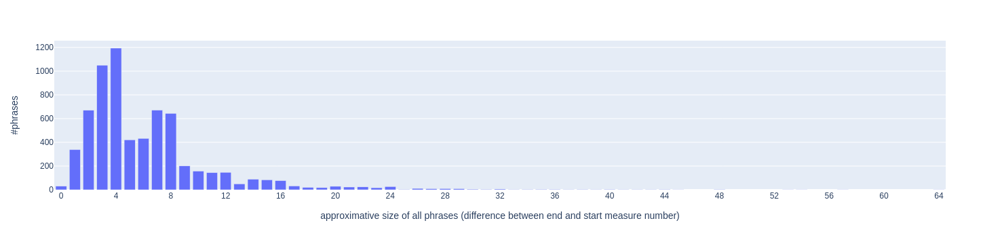

In [35]:
phrase_gpb = phrase_segments.groupby(level=[0,1,2])
phrase_length_in_measures = phrase_gpb.mn.max() - phrase_gpb.mn.min()
measure_length_counts = phrase_length_in_measures.value_counts()
fig = px.bar(x=measure_length_counts.index, y=measure_length_counts, labels=dict(x="approximative size of all phrases (difference between end and start measure number)",
                                                                           y="#phrases"))
fig.update_xaxes(dtick=4)

### Histogram summarizing phrase lengths by precise length expressed in measures

**In order to divide the phrase length by the length of a measure, the phrases containing more than one time signature are filtered out.**

**Durations computed by dividing the duration by the measure length**

Filtered out the 69 phrases incorporating more than one time signature.


,#time signatures,#phrases
0,1,6619
1,2,68
2,3,1


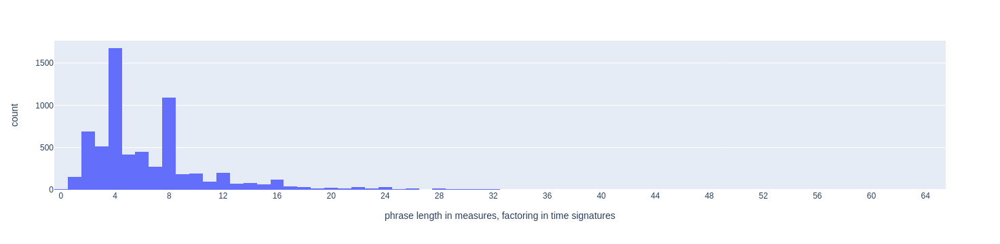

In [84]:
phrase2timesigs = phrase_gpb.timesig.unique()
n_timesignatures_per_phrase = phrase2timesigs.map(len)
uniform_timesigs = phrase2timesigs[n_timesignatures_per_phrase == 1].map(lambda l: l[0])
more_than_one = n_timesignatures_per_phrase > 1
print(f"Filtered out the {more_than_one.sum()} phrases incorporating more than one time signature.")
n_timesigs = n_timesignatures_per_phrase.value_counts()
display(n_timesigs.reset_index().rename(columns=dict(index='#time signatures', timesig='#phrases')))
uniform_timesig_phrases = phrases.loc[uniform_timesigs.index]
timesig_in_quarterbeats = uniform_timesigs.map(Fraction) * 4
exact_measure_lengths = uniform_timesig_phrases.duration_qb / timesig_in_quarterbeats
uniform_timesigs = pd.concat([exact_measure_lengths.rename('duration_measures'), uniform_timesig_phrases], axis=1)
uniform_timesigs.to_csv('cadence_datasets_uniform_timesigs.tsv.zip', sep='\t')
fig = px.histogram(uniform_timesigs, x='duration_measures', 
                   labels=dict(duration_measures='phrase length in measures, factoring in time signatures'))
fig.update_traces(xbins=dict( # bins used for histogram
        #start=0.0,
        #end=100.0,
        size=1
    ))
fig.update_xaxes(dtick=4)

In [37]:
uniform_timesigs.head(10).style.apply(color_background, subset='duration_measures')

### Inspecting long phrases

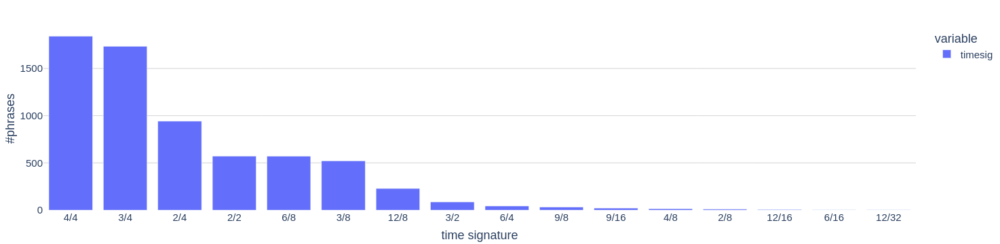

In [38]:
timsig_counts = uniform_timesigs.timesig.value_counts()
fig = px.bar(timsig_counts, labels=dict(index="time signature", value="#phrases"))
fig.update_layout(**STD_LAYOUT)
fig.update_yaxes(gridcolor='lightgrey')

In [39]:
filter_counts_smaller_than = 5
filtered_timesigs = timsig_counts[timsig_counts < filter_counts_smaller_than].index.to_list()

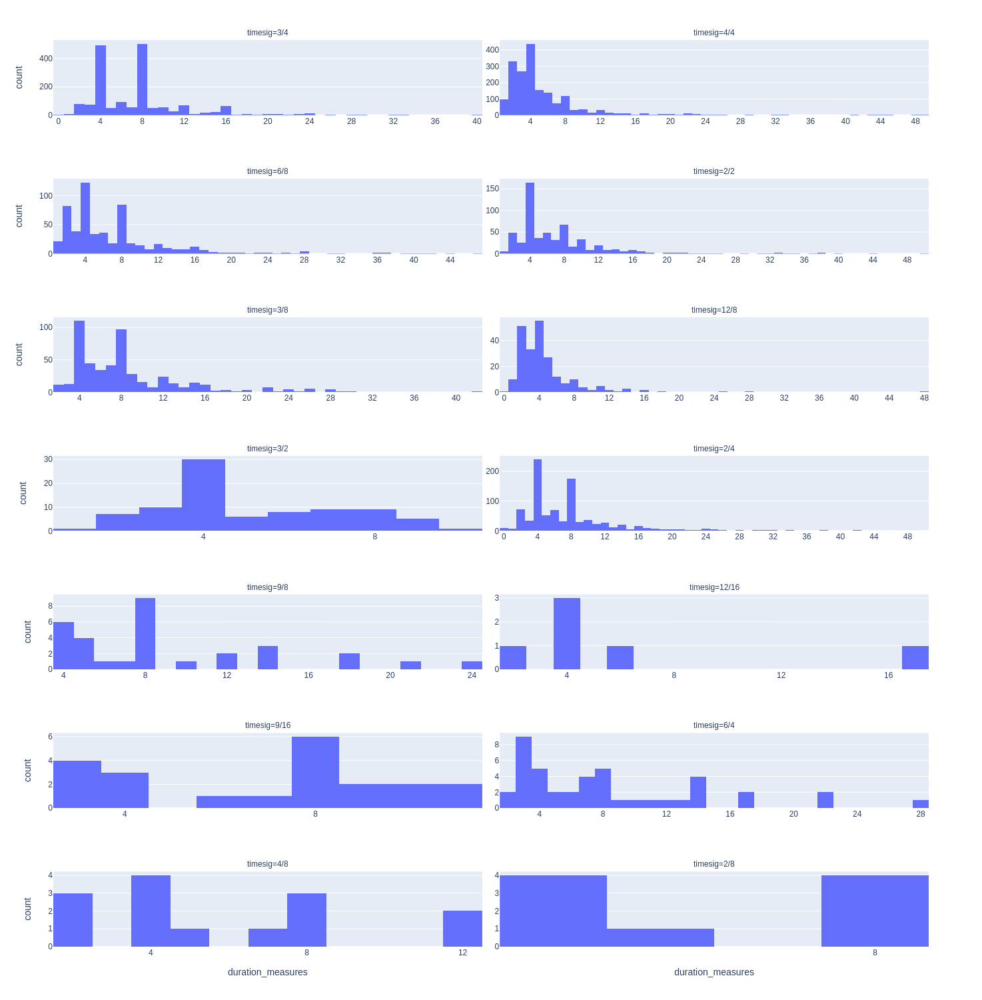

In [40]:
fig = px.histogram(uniform_timesigs[~uniform_timesigs.timesig.isin(filtered_timesigs)], 
                   x='duration_measures', facet_col='timesig', facet_col_wrap=2, height=1500)
fig.update_xaxes(matches=None, showticklabels=True, visible=True, dtick=4)
fig.update_yaxes(matches=None, showticklabels=True, visible=True)
fig.update_traces(xbins=dict( # bins used for histogram
        #start=0.0,
        end=50.0,
        size=1
    ))

In [41]:
see_greater_equal = 33
longest_measure_length = uniform_timesigs.loc[uniform_timesigs.duration_measures >= see_greater_equal, ["duration_measures", "timesig"]]
for timesig, long_phrases in longest_measure_length.groupby('timesig'):
    L = len(long_phrases)
    plural = 's' if L > 1 else ''
    display(HTML(f"<h3>{L} long phrase{plural} in {timesig} meter:</h3>"))
    display(long_phrases.sort_values('duration_measures'))

,,,duration_measures,timesig
corpus,fname,phrase_slice,,
bach_solo,BWV1012_01_Prelude,"[306.0, 594.0)",48.0,12/8


duration_measures timesig
corpus                  fname      phrase_slice                             
grieg_lyrical_pieces    op57n02    [64.0, 196.0)                33.0     2/2
                                   [260.0, 392.0)               33.0     2/2
beethoven_piano_sonatas 26-1       [800.0, 936.0)               34.0     2/2
pleyel_quartets         b309op2n3b [500.0, 640.0)               35.0     2/2
beethoven_piano_sonatas 09-3       [186.0, 332.0)               36.5     2/2
                        08-1       [200.0, 352.0)               38.0     2/2
                        21-3       [804.0, 956.0)               38.0     2/2
                        26-1       [244.0, 404.0)               40.0     2/2
                        21-3       [956.0, 1132.0)              44.0     2/2
                        08-1       [576.0, 776.0)               50.0     2/2

duration_measures  \
corpus                  fname                                              phrase_slice                                       
liszt_pelerinage        160.09_Les_Cloches_de_Geneve_(Nocturne)            [202.5, 270.0)                             33.75   
grieg_lyrical_pieces    op68n03                                            [0.0, 68.0)                                 34.0   
                        op38n01                                            [100.0, 172.0)                              36.0   
                        op68n04                                            [16.0, 92.0)                                38.0   
                                                                           [92.0, 168.0)                               38.0   
beethoven_piano_sonatas 06-1                                               [152.5, 234.0)                             40.75   
grieg_lyrical_pieces    op54n06                                            [36.0, 120.0)                               42.0   
liszt_pelerinage        162.03_Tarantella_da_Guillaume_Louis_Cottrau._P... [1025.5416666666667, 1109.875)         42.166667   
                                                                           [885.875, 970.875)                          42.5   
beethoven_piano_sonatas 02-1                                               [360.0, 448.0)                              44.0   
                        21-3                                               [476.0, 572.0)                              48.0   
liszt_pelerinage        160.09_Les_Cloches_de_Geneve_(Nocturne)            [302.0, 401.25)                           49.625   
beethoven_piano_sonatas 23-3                                               [314.0, 422.0)                              54.0   

                                                                                                          timesig  
corpus                  fname                                              phrase_slice                            
liszt_pelerinage        160.09_Les_Cloches_de_Geneve_(Nocturne)            [202.5, 270.0)                     2/4  
grieg_lyrical_pieces    op68n03                                            [0.0, 68.0)                        2/4  
                        op38n01                                            [100.0, 172.0)                     2/4  
                        op68n04                                            [16.0, 92.0)                       2/4  
                                                                           [92.0, 168.0)                      2/4  
beethoven_piano_sonatas 06-1                                               [152.5, 234.0)                     2/4  
grieg_lyrical_pieces    op54n06                                            [36.0, 120.0)                      2/4  
liszt_pelerinage        162.03_Tarantella_da_Guillaume_Louis_Cottrau._P... [1025.5416666666667, 1109.875)     2/4  
                                                                           [885.875, 970.875)                 2/4  
beethoven_piano_sonatas 02-1                                               [360.0, 448.0)                     2/4  
                        21-3                                               [476.0, 572.0)                     2/4  
liszt_pelerinage        160.09_Les_Cloches_de_Geneve_(Nocturne)            [302.0, 401.25)                    2/4  
beethoven_piano_sonatas 23-3                                               [314.0, 422.0)                     2/4

,,,duration_measures,timesig
corpus,fname,phrase_slice,,
chopin_mazurkas,BI153-1op56-1,"[306.0, 426.0)",40.0,3/4
debussy_suite_bergamasque,l075-02_suite_menuet,"[147.0, 312.0)",55.0,3/4


duration_measures timesig
corpus                  fname phrase_slice                              
beethoven_piano_sonatas 17-3  [258.75, 321.0)               41.5     3/8
                              [140.75, 225.75)         56.666667     3/8

duration_measures  \
corpus                    fname                                  phrase_slice                           
liszt_pelerinage          160.06_Vallee_dObermann                [165.0, 297.0)                  33.0   
mahler_kindertotenlieder  kindertotenlieder_01_nun_will_die_sonn [144.0, 308.0)                  41.0   
beethoven_piano_sonatas   32-1                                   [364.125, 536.125)              43.0   
                          21-1                                   [444.0, 620.0)                  44.0   
debussy_suite_bergamasque l075-04_suite_passepied                [152.0, 332.0)                  45.0   
liszt_pelerinage          161.07_Apres_une_lecture_du_Dante      [909.0, 1101.0)                 48.0   
                          160.06_Vallee_dObermann                [515.5, 711.25)              48.9375   
mahler_kindertotenlieder  kindertotenlieder_05_in_diesem_wetter  [236.0, 495.0)                 64.75   

                                                                                    timesig  
corpus                    fname                                  phrase_slice                
liszt_pelerinage          160.06_Vallee_dObermann                [165.0, 297.0)         4/4  
mahler_kindertotenlieder  kindertotenlieder_01_nun_will_die_sonn [144.0, 308.0)         4/4  
beethoven_piano_sonatas   32-1                                   [364.125, 536.125)     4/4  
                          21-1                                   [444.0, 620.0)         4/4  
debussy_suite_bergamasque l075-04_suite_passepied                [152.0, 332.0)         4/4  
liszt_pelerinage          161.07_Apres_une_lecture_du_Dante      [909.0, 1101.0)        4/4  
                          160.06_Vallee_dObermann                [515.5, 711.25)        4/4  
mahler_kindertotenlieder  kindertotenlieder_05_in_diesem_wetter  [236.0, 495.0)         4/4

duration_measures  \
corpus                  fname                                              phrase_slice                         
beethoven_piano_sonatas 18-4                                               [83.5, 190.0)                 35.5   
                                                                           [272.5, 380.5)                36.0   
liszt_pelerinage        162.03_Tarantella_da_Guillaume_Louis_Cottrau._P... [0.0, 111.0)                  37.0   
grieg_lyrical_pieces    op62n05                                            [74.5, 186.0)            37.166667   
beethoven_piano_sonatas 03-4                                               [774.5, 891.5)                39.0   
                        18-4                                               [596.5, 715.0)                39.5   
liszt_pelerinage        160.09_Les_Cloches_de_Geneve_(Nocturne)            [0.0, 123.0)                  41.0   
beethoven_piano_sonatas 31-3                                               [229.5, 354.0)                41.5   
                        18-4                                               [380.5, 512.5)                44.0   
liszt_pelerinage        162.01_Gondoliera                                  [243.5, 385.625)            47.375   

                                                                                            timesig  
corpus                  fname                                              phrase_slice              
beethoven_piano_sonatas 18-4                                               [83.5, 190.0)        6/8  
                                                                           [272.5, 380.5)       6/8  
liszt_pelerinage        162.03_Tarantella_da_Guillaume_Louis_Cottrau._P... [0.0, 111.0)         6/8  
grieg_lyrical_pieces    op62n05                                            [74.5, 186.0)        6/8  
beethoven_piano_sonatas 03-4                                               [774.5, 891.5)       6/8  
                        18-4                                               [596.5, 715.0)       6/8  
liszt_pelerinage        160.09_Les_Cloches_de_Geneve_(Nocturne)            [0.0, 123.0)         6/8  
beethoven_piano_sonatas 31-3                                               [229.5, 354.0)       6/8  
                        18-4                                               [380.5, 512.5)       6/8  
liszt_pelerinage        162.01_Gondoliera                                  [243.5, 385.625)     6/8

## Local keys

In [42]:
local_keys_per_phrase = phrase_gpb.localkey.unique().map(tuple)
n_local_keys_per_phrase = local_keys_per_phrase.map(len)
phrases_with_keys = pd.concat([n_local_keys_per_phrase.rename('n_local_keys'),
                               local_keys_per_phrase.rename('local_keys'),
                               phrases], axis=1)
phrases_with_keys.head(10).style.apply(color_background, subset=['n_local_keys', 'local_keys'])

### Number of unique local keys per phrase

In [43]:
count_n_keys = phrases_with_keys.n_local_keys.value_counts().rename("#phrases").to_frame()
count_n_keys.index.rename("unique keys", inplace=True)
count_n_keys

,#phrases
unique keys,
1,5422
2,1143
3,97
4,17
6,7
5,1
8,1


### The most frequent keys for non-modulating phrases

In [44]:
unique_key_selector = phrases_with_keys.n_local_keys == 1
phrases_with_unique_key = phrases_with_keys[unique_key_selector].copy()
phrases_with_unique_key.local_keys = phrases_with_unique_key.local_keys.map(lambda t: t[0])
value_count_df(phrases_with_unique_key.local_keys, counts="#phrases")

,#phrases
local_keys,
I,2450
i,1579
V,451
III,281
v,172
vi,125
IV,56
iii,55
VI,53


### Most frequent modulations within one phrase

In [45]:
two_keys_selector = phrases_with_keys.n_local_keys > 1
phrases_with_unique_key = phrases_with_keys[two_keys_selector].copy()
value_count_df(phrases_with_unique_key.local_keys, "modulations")

,counts
modulations,
"(I, V)",135
"(V, I)",97
"(i, III)",90
"(III, i)",79
"(i, v)",62
"(I, vi)",59
"(vi, I)",56
"(v, i)",51
"(iv, i)",32


# Cadences
## Overall

* **PAC**: Perfect Authentic Cadence
* **IAC**: Imperfect Authentic Cadence
* **HC**: Half Cadence
* **DC**: Deceptive Cadence
* **EC**: Evaded Cadence
* **PC**: Plagal Cadence

In [46]:
HTML('''<script>
  function code_toggle() {
    if (code_shown){
      $('div.input').hide('500');
      $('#toggleButton').val('Show Code')
    } else {
      $('div.input').show('500');
      $('#toggleButton').val('Hide Code')
    }
    code_shown = !code_shown
  }
  $( document ).ready(function(){
    code_shown=false;
    $('div.input').hide()
  });
</script>
<form action="javascript:code_toggle()"><input type="submit" id="toggleButton" value="Show Code"></form>''')

In [47]:
print(f"{all_labels.cadence.notna().sum()} cadence labels.")
value_count_df(all_labels.cadence)

5805 cadence labels.


,counts
cadence,
PAC,2809
HC,1599
IAC,1085
EC,137
DC,103
PC,72


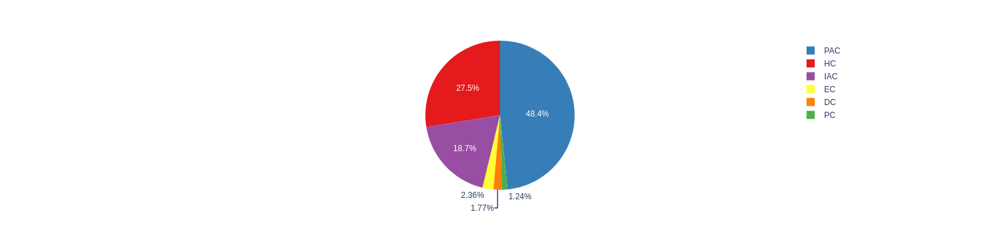

In [48]:
px.pie(all_labels[all_labels.cadence.notna()], names="cadence", color="cadence", color_discrete_map=cadence_colors)

## Per dataset

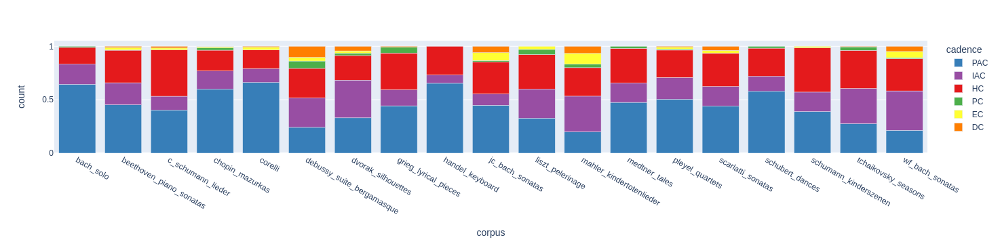

In [49]:
cadence_count_per_dataset = all_labels.groupby("corpus").cadence.value_counts()
cadence_fraction_per_dataset = cadence_count_per_dataset / cadence_count_per_dataset.groupby(level=0).sum()
px.bar(cadence_fraction_per_dataset.rename('count').reset_index(), x='corpus', y='count', color='cadence',
      color_discrete_map=cadence_colors, category_orders=dict(dataset=chronological_order))

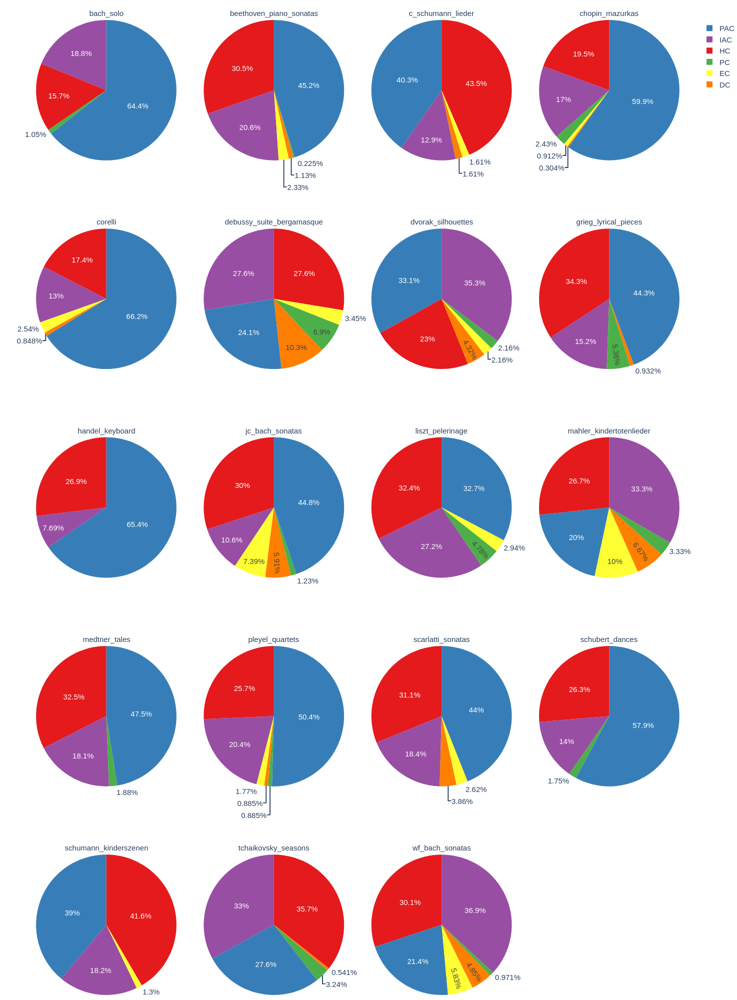

In [50]:
fig = px.pie(cadence_count_per_dataset.rename('count').reset_index(), names='cadence', color='cadence', values='count', 
       facet_col='corpus', facet_col_wrap=4, height=2000, color_discrete_map=cadence_colors)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_layout(**STD_LAYOUT)

## Per phrase
### Number of cadences per phrase

In [51]:
phrases_with_cadences = pd.concat([
    phrase_gpb.cadence.nunique().rename('n_cadences'),
    phrase_gpb.cadence.unique().rename('cadences').map(lambda l: tuple(e for e in l if not pd.isnull(e))),
    phrases_with_keys
], axis=1)
value_count_df(phrases_with_cadences.n_cadences, counts="#phrases")

,#phrases
n_cadences,
1,5344
0,1174
2,166
3,4


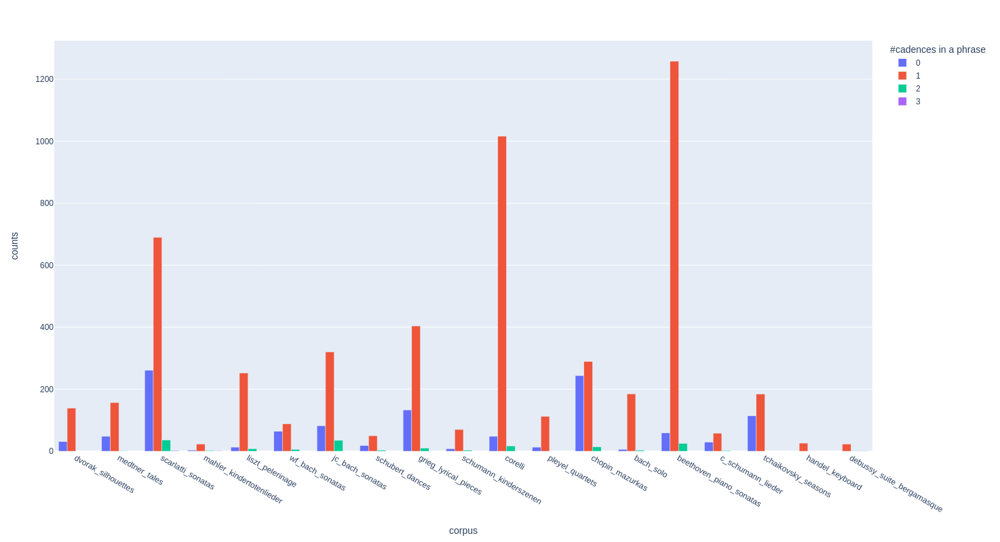

In [52]:
n_cad = phrases_with_cadences.groupby(level='corpus').n_cadences.value_counts().rename('counts').reset_index().sort_values('n_cadences')
n_cad.n_cadences = n_cad.n_cadences.astype(str)
fig = px.bar(n_cad, x='corpus', y='counts', color='n_cadences', height=800, barmode='group',
             labels=dict(n_cadences="#cadences in a phrase"),
             category_orders=dict(dataset=chronological_order)
      )
fig.show()

### Combinations of cadence types for phrases with more than one cadence

In [53]:
value_count_df(phrases_with_cadences[phrases_with_cadences.n_cadences > 1].cadences)

,counts
cadences,
"(DC, PAC)",40
"(HC, PAC)",38
"(EC, PAC)",35
"(IAC, PAC)",12
"(EC, HC)",11
"(PAC, HC)",6
"(DC, HC)",4
"(EC, IAC)",3
"(DC, IAC)",3


### Positioning of cadences within phrases

In [54]:
df_rows = []
y_position = 0
for ix in phrases_with_cadences[phrases_with_cadences.n_cadences > 0].sort_values('duration_qb').index:
    df = phrase_segments.loc[ix]
    description = str(ix)
    if df.cadence.notna().any():
        interval = ix[2]
        df_rows.append((y_position, interval.length, "end of phrase", description))
        start_pos = interval.left
        cadences = df.loc[df.cadence.notna(), ['quarterbeats', 'cadence']]
        cadences.quarterbeats -= start_pos
        for cadence_x, cadence_type in cadences.itertuples(index=False, name=None):
            df_rows.append((y_position, cadence_x, cadence_type, description))
        y_position += 1
    #else:
    #    df_rows.append((y_position, pd.NA, pd.NA, description))
data = pd.DataFrame(df_rows, columns=["phrase_ix", "x", "marker", "description"])

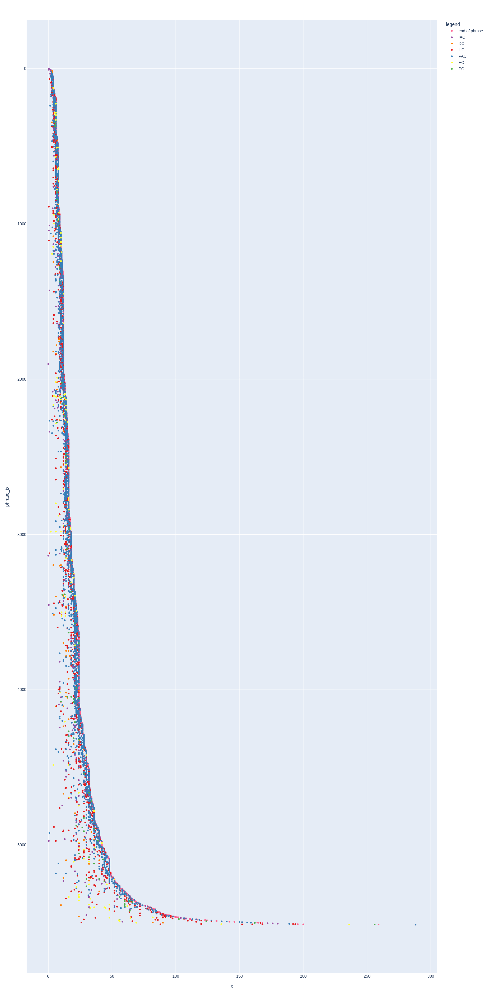

In [55]:
fig = px.scatter(data[data.x.notna()], x='x', y="phrase_ix", color="marker", hover_name="description", height=3000,
                labels=dict(marker='legend'), color_discrete_map=cadence_colors)
fig.update_traces(marker_size=5)
fig.update_yaxes(autorange="reversed")
fig.show()

## Cadence ultima

In [56]:
HTML('''<script>
  function code_toggle() {
    if (code_shown){
      $('div.input').hide('500');
      $('#toggleButton').val('Show Code')
    } else {
      $('div.input').show('500');
      $('#toggleButton').val('Hide Code')
    }
    code_shown = !code_shown
  }
  $( document ).ready(function(){
    code_shown=false;
    $('div.input').hide()
  });
</script>
<form action="javascript:code_toggle()"><input type="submit" id="toggleButton" value="Show Code"></form>''')

In [57]:
phrase_segments = segmented.get_facet("expanded")
cadence_selector = phrase_segments.cadence.notna()
missing_chord_selector = phrase_segments.chord.isna()
cadence_with_missing_chord_selector = cadence_selector & missing_chord_selector
#print(f"Ultima missing for {cadence_with_missing_chord_selector.sum()} cadences.")
missing = phrase_segments[cadence_with_missing_chord_selector]
expanded = ms3.expand_dcml.expand_labels(phrase_segments[cadence_with_missing_chord_selector], propagate=False, chord_tones=True, skip_checks=True)
phrase_segments.loc[cadence_with_missing_chord_selector] = expanded
print(f"Ultima harmony missing for {(phrase_segments.cadence.notna() & phrase_segments.bass_note.isna()).sum()} cadence labels.")

MC 49: #vii in major context corrected to vii.


Ultima harmony missing for 29 cadence labels.


### Ultimae as Roman numeral

In [58]:
def highlight(row, color="#ffffb3"):
    if row.counts < 10:
        return [None, None, None, None]
    else:
        return ["background-color: #ffffb3;"] * 4

cadence_counts = all_labels.cadence.value_counts()
ultima_root = phrase_segments.groupby(['localkey_is_minor', 'cadence']).numeral.value_counts().rename('counts').to_frame().reset_index()
ultima_root.localkey_is_minor = ultima_root.localkey_is_minor.map({False: 'in major', True: 'in minor'})
#ultima_root.style.apply(highlight, axis=1)

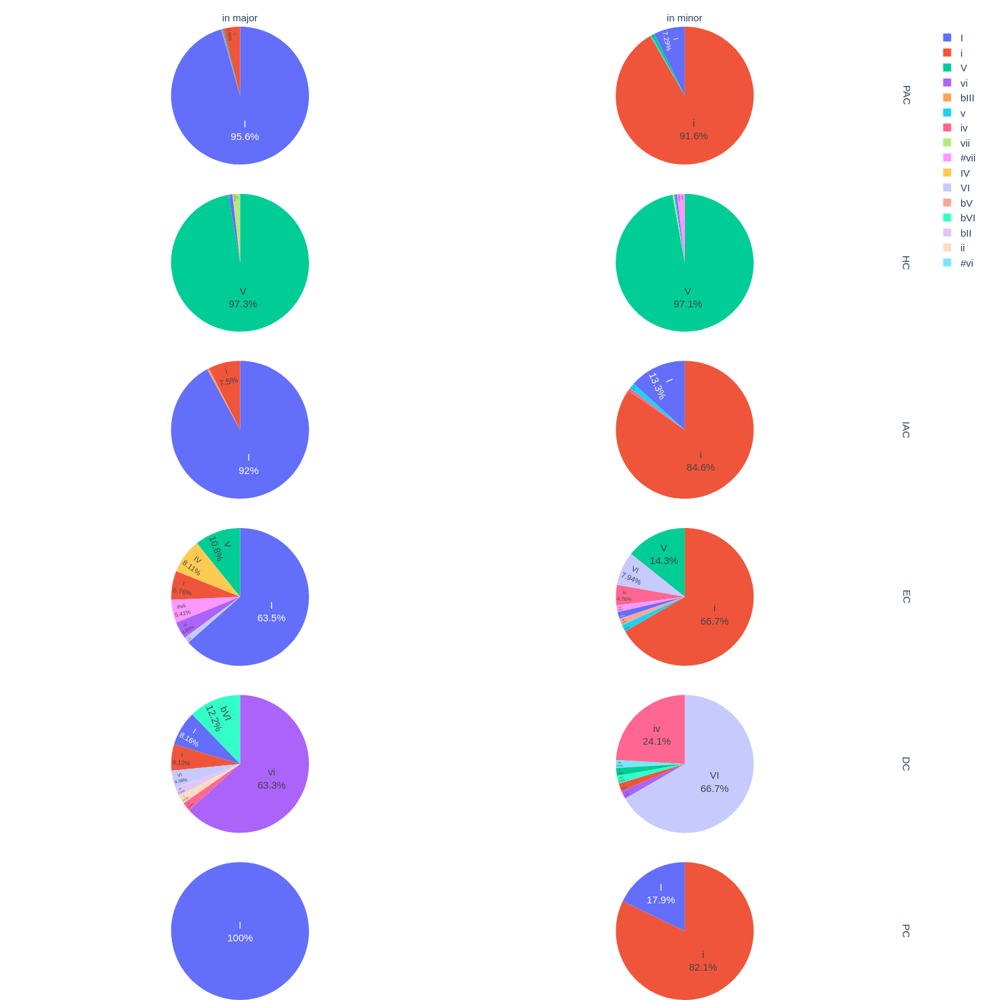

In [59]:
fig = px.pie(ultima_root, names='numeral', values='counts', 
             facet_row='cadence', facet_col='localkey_is_minor', 
             height=1500,
             category_orders={'cadence': cadence_counts.index},
            )
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(**STD_LAYOUT)
fig.show()

In [60]:
#phrase_segments.groupby(level=[0,1,2], group_keys=False).apply(lambda df: df if ((df.cadence == 'PAC') & (df.numeral == 'V')).any() else None)

### Ultimae bass note as scale degree

In [61]:
ultima_bass = phrase_segments.groupby(['localkey_is_minor','cadence']).bass_note.value_counts().rename('counts').reset_index()
ultima_bass.bass_note = ms3.transform(ultima_bass, ms3.fifths2sd, dict(fifths='bass_note', minor='localkey_is_minor'))
ultima_bass.localkey_is_minor = ultima_bass.localkey_is_minor.map({False: 'in major', True: 'in minor'})
#ultima_bass.style.apply(highlight, axis=1)

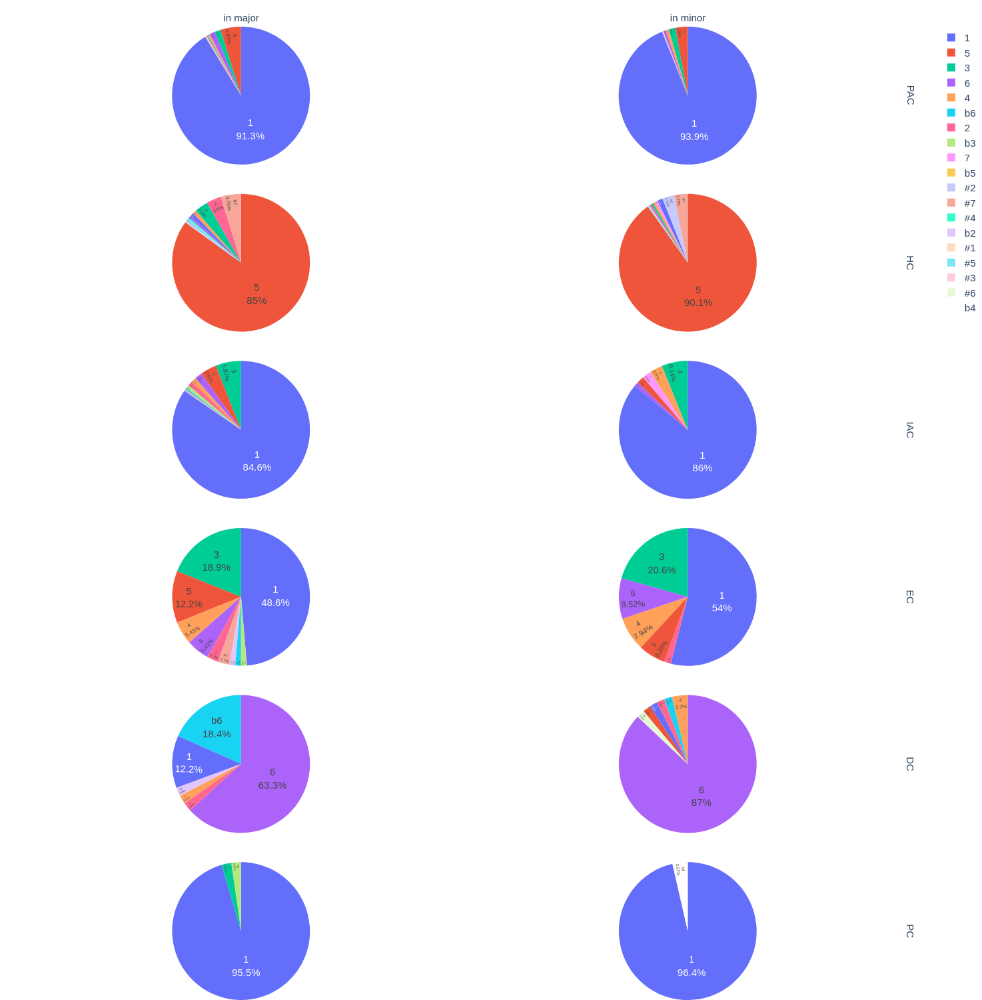

In [62]:
fig = px.pie(ultima_bass, names='bass_note', values='counts', 
             facet_row='cadence', facet_col='localkey_is_minor', 
             height=1500, 
             category_orders={'cadence': cadence_counts.index},
            )
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(**STD_LAYOUT)
fig.show()

## Chord progressions

### PACs with ultima I/i

In [63]:
#pac_on_i = phrase_segments.groupby(level=[0,1,2], group_keys=False).apply(lambda df: df if ((df.cadence == 'PAC') & (df.numeral.isin(('I', 'i')))).any() else None)
#pac_on_i.cadence.value_counts()
#pac_on_i.droplevel(-1).index.nunique()

In [64]:
def get_progressions(selected='PAC', last_row={}, feature='chord', dataset=None, as_series=True):
    """Uses the nonlocal variable phrase_segments."""
    last_row = {k: v if isinstance(v, tuple) else (v,) for k, v in last_row.items()}
    progressions = []

    for (corp, fname, *_), df in phrase_segments[phrase_segments[feature].notna()].groupby(level=[0,1,2]):
        if dataset is not None and dataset not in corp:
            continue
        if (df.cadence == selected).fillna(False).any():
            # remove chords after the last cadence label
            df = df[df.cadence.fillna(method='bfill').notna()]
            # group segments leading up to a cadence label
            cadence_groups = df.cadence.notna().shift().fillna(False).cumsum()
            for i, cadence in df.groupby(cadence_groups):
                last_r = cadence.iloc[-1]
                typ = last_r.cadence
                if typ != selected:
                    continue
                if any(last_r[feat] not in values for feat, values in last_row.items()):
                    continue
                progressions.append(tuple(cadence[feature]))
    if as_series:
        return pd.Series(progressions)
    return progressions



In [65]:
chord_progressions = get_progressions('PAC', dict(numeral=('I', 'i')), 'chord')
print(f"Progressions for {len(chord_progressions)} cadences:")
value_count_df(chord_progressions, "chord progressions")

Progressions for 2774 cadences:


,counts
chord progressions,
"(V, V7, I, ii6(2), ii6, V7, I)",12
"(I, V7, I)",12
"(I, I6, IV, V(64), V, I)",10
"(I, IV, V(64), V, I)",9
"(i, VM7, i, V7, V7(#2), V7, i)",8
...,...
"(i, iv, V, iv6, V, VI, i, iv, i, iv, iv6, V, i6, i, V, iv6, V, iv, iv7, V, i)",1
"(i6, ii%65, V(4), V, i)",1
"(i, V6, i, iv6(2), iv6, iio6, V, III, VII(4), VII, #viio, i(9), i, i6, ii%65, V(4), V, i)",1


In [66]:
numeral_progressions = get_progressions('PAC', dict(numeral=('I', 'i')), 'numeral')
value_count_df(numeral_progressions, "numeral progressions")

,counts
numeral progressions,
"(I, V, V, I)",21
"(I, IV, V, V, I)",18
"(I, V, I)",16
"(I, V, I, V, I, V, I, V, I)",13
"(I, I, IV, V, V, I)",13
...,...
"(I, ii, I, I, ii, V, V, I)",1
"(i, V, iv, ii, V, i, V, V, i)",1
"(v, i, iv, V, III, VI, ii, V, i, iv, V, i, iv, ii, V, i, V, V, i)",1


In [67]:
def remove_immediate_duplicates(l):
    return tuple(a for a, b in zip(l, (None, ) + l) if a != b)

numeral_prog_no_dups = numeral_progressions.map(remove_immediate_duplicates)
value_count_df(numeral_prog_no_dups)

,counts
"(I, V, I)",56
"(I, IV, V, I)",49
"(I, V, I, V, I)",32
"(I, V, I, ii, V, I)",24
"(i, V, i, V, i)",23
...,...
"(I, vii, vi, #vii, i)",1
"(V, iii, IV, ii, V, I, IV, V, I, ii, V, I)",1
"(I, IV, V, I, vi, V, IV, iii, I, ii, V, I)",1
"(i, V, IV, V, VI, ii, V, i)",1


### PACs ending on scale degree 1

**Scale degrees expressed w.r.t. major scale, regardless of actual key.**

In [68]:
bass_progressions = get_progressions('PAC', dict(bass_note=0), 'bass_note')
bass_prog = bass_progressions.map(ms3.fifths2sd)
print(f"Progressions for {len(bass_progressions)} cadences:")
value_count_df(bass_prog, "bass progressions")

Progressions for 2580 cadences:


,counts
bass progressions,
"(1, 4, 5, 5, 1)",23
"(1, 5, 1)",23
"(1, 3, 4, 5, 5, 1)",17
"(1, 5, 5, 1)",15
"(5, 5, 1, 4, 4, 5, 1)",12
...,...
"(1, 3, 4, 4, 4, b3, 5, 5, 1)",1
"(5, 1, b6, 7, 5, b6, 4, 5, 1, 4, #7, 1, 4, 4, 4, b3, 5, 5, 1)",1
"(1, 4, 1, 5, 5, 1)",1


In [69]:
bass_prog_no_dups = bass_prog.map(remove_immediate_duplicates)
value_count_df(bass_prog_no_dups)

,counts
"(1, 5, 1)",50
"(1, 5, 1, 5, 1)",38
"(1, 4, 5, 1)",35
"(1, 3, 4, 5, 1)",25
"(5, 1, 4, 5, 1)",19
...,...
"(1, #7, 1, 3, 4, 5, 1, 5, 4, 5, 1)",1
"(1, b3, 1, 2, 5, 1)",1
"(1, 6, #7, 1, #7, 6, 2, 5, 1, 4, #4, 5, 1)",1
"(1, #7, 1, 3, 4, 5, b3, #7, 1, #7, 1)",1


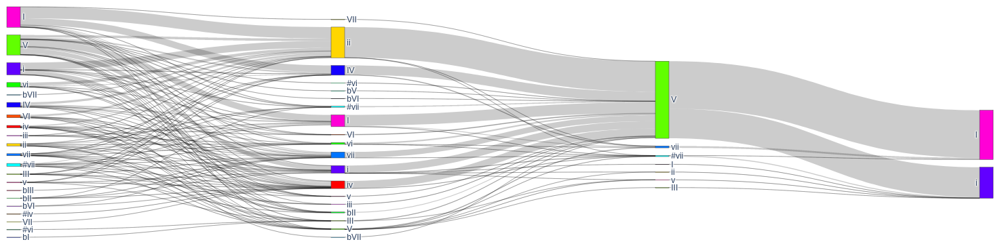

In [70]:
def make_sankey(data, labels, node_pos=None, margin={'l': 10, 'r': 10, 'b': 10, 't': 10}, pad=20, color='auto', **kwargs):
    if color=='auto':
        unique_labels = set(labels)
        color_step = 100 / len(unique_labels)
        unique_colors = {label: f'hsv({round(i*color_step)}%,100%,100%)' for i, label in enumerate(unique_labels)}
        color = list(map(lambda l: unique_colors[l], labels))
    fig = go.Figure(go.Sankey(
        arrangement = 'snap',
        node = dict(
          pad = pad,
          #thickness = 20,
          #line = dict(color = "black", width = 0.5),
          label = labels,
          x = [node_pos[i][0] if i in node_pos else 0 for i in range(len(labels))] if node_pos is not None else None,
          y = [node_pos[i][1] if i in node_pos else 0 for i in range(len(labels))] if node_pos is not None else None,
          color = color,
          ),
        link = dict(
          source = data.source,
          target = data.target,
          value = data.value
          ),
        ),
     )

    fig.update_layout(margin=margin, **kwargs)
    return fig

def progressions2graph_data(progressions, cut_at_stage=None):
    stage_nodes = defaultdict(dict)
    edge_weights = Counter()
    node_counter = 0
    for progression in progressions:
        previous_node = None
        for stage, current in enumerate(reversed(progression)):
            if cut_at_stage and stage > cut_at_stage:
                break
            if current in stage_nodes[stage]:
                current_node = stage_nodes[stage][current]
            else:
                stage_nodes[stage][current] = node_counter
                current_node = node_counter
                node_counter += 1
            if previous_node is not None:
                edge_weights.update([(current_node, previous_node)])
            previous_node = current_node
    return stage_nodes, edge_weights

def graph_data2sankey(stage_nodes, edge_weights):
    data = pd.DataFrame([(u, v, w) for (u, v), w in edge_weights.items()], columns = ['source', 'target', 'value'])
    node2label = {node: label for stage, nodes in stage_nodes.items() for label, node in nodes.items()}
    labels = [node2label[i] for i in range(len(node2label))]
    return make_sankey(data, labels)

def plot_progressions(progressions, cut_at_stage=None):
    stage_nodes, edge_weights = progressions2graph_data(progressions, cut_at_stage=cut_at_stage)
    return graph_data2sankey(stage_nodes, edge_weights)

plot_progressions(numeral_prog_no_dups, cut_at_stage=3)

In [71]:
chord_progressions_minor = get_progressions('PAC', dict(numeral='i', localkey_is_minor=True), 'root')
chord_progressions_minor

0       (1, 0, 0, 0, 0, 2, 1, 0, -4, -1, 1, 0, -1, 5, ...
1       (0, -2, -3, -1, 5, 1, 1, 0, -2, -4, 1, -1, -3,...
2          (0, 5, 5, 0, 0, 2, -1, 1, 1, 1, 5, 0, 2, 1, 0)
3                         (1, 0, 1, 1, 1, 1, -1, 0, 1, 0)
4                                         (0, 1, 0, 5, 0)
                              ...                        
1001    (1, 1, 1, 0, 5, 0, 2, 2, -1, -1, 5, 1, 0, 2, 1...
1002                                     (-4, 6, 1, 1, 0)
1003    (1, 1, 5, 0, 2, 1, 1, 4, -1, -1, 2, 5, 0, -1, ...
1004    (1, 1, 1, 0, -1, -1, -1, -2, -2, -3, -3, -4, -...
1005                                     (0, -1, 1, 1, 0)
Length: 1006, dtype: object

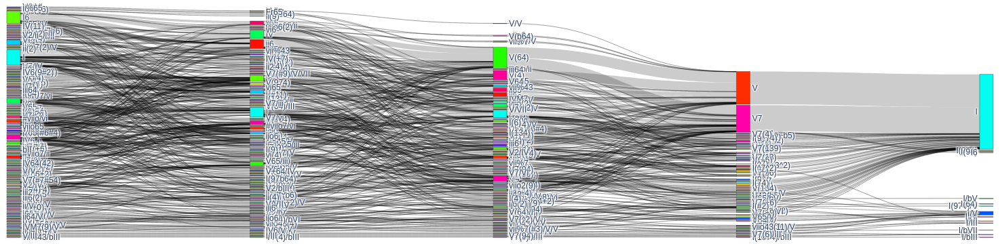

In [72]:
pac_major = get_progressions('PAC', dict(numeral='I', localkey_is_minor=False), 'chord')
plot_progressions(pac_major, cut_at_stage=4)

In [73]:
deceptive = get_progressions('DC', dict(localkey_is_minor=False), 'chord')
deceptive.value_counts()

(I, V43(4), I6, IV, V7, vi)                                                                                                                                                                                                                                                                                       3
(i, viio43/V, V6, i, viio43/V, V6, I, IV6, I6, IV, viio6, I6, IV6, viio, I, ii65, V, vi)                                                                                                                                                                                                                          2
(I, IV, V/vi, vi, V, I, IV, V(64), V7, vi)                                                                                                                                                                                                                                                                        2
(I, V, ii7(9), V, V, ii7(9), V, V7, ii7(9), V, ii7, V, ii7(13), ii7, V7(#2),

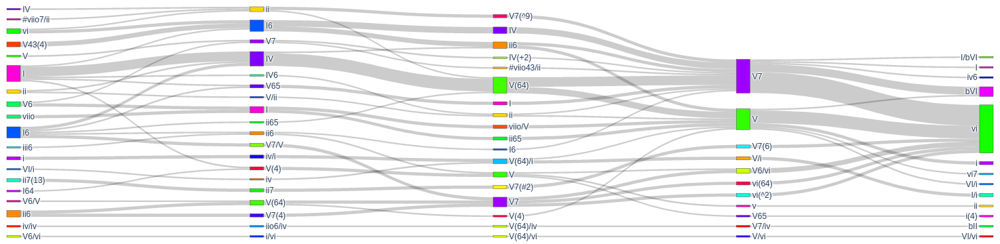

In [74]:
plot_progressions(deceptive, cut_at_stage=4)

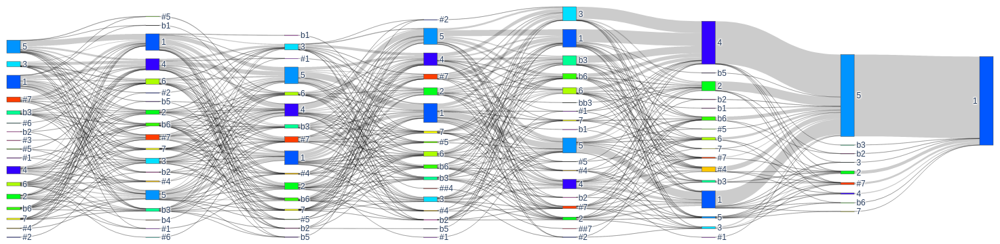

In [75]:
plot_progressions(bass_prog_no_dups, cut_at_stage=7)

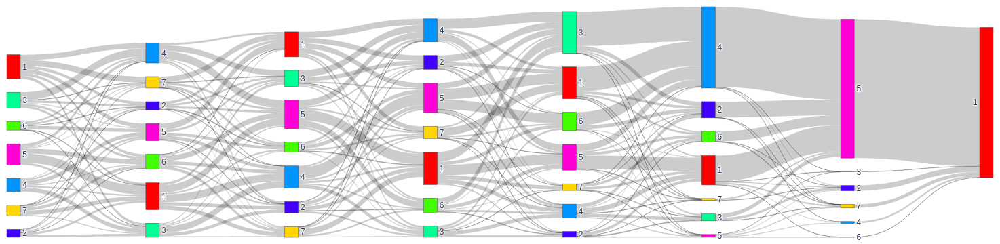

In [76]:
def remove_sd_accidentals(t):
    return tuple(map(lambda sd: sd[-1], t))
                  
bass_prog_no_acc_no_dup = bass_prog.map(remove_sd_accidentals).map(remove_immediate_duplicates)
plot_progressions(bass_prog_no_acc_no_dup, cut_at_stage=7)

### HCs ending on V

Progressions for 1541 cadences:


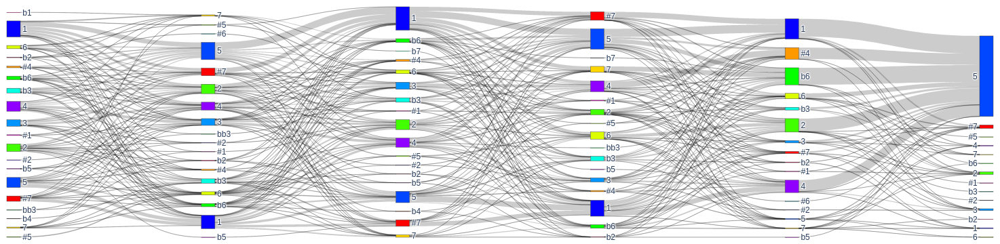

In [77]:
half = get_progressions('HC', dict(numeral='V'), 'bass_note').map(ms3.fifths2sd)
print(f"Progressions for {len(half)} cadences:")
plot_progressions(half.map(remove_immediate_duplicates), cut_at_stage=5)